In [70]:
# Importa las librerias necesarias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

sns.set()

Objetivo: Se cuenta con el dataset de incumplimiento de clientes para una compañía de tarjetas de crédito. De cada cliente se tiene el balance que le llegó de la tarjeta, si es un estudiante universitario o no y el sueldo anual. Además, se dispone si el cliente incumplió el pago o no.

In [60]:
# Carga de datos en un DataFrame
credit = pd.read_csv("./dataset/UCI_Credit_Card.csv")

In [32]:
# Visualizacion de los primeros registros
credit.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [33]:
# Despliega informacion del dataset
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [34]:
# Muestra estadisitca de las variables
credit.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [35]:
# Busca el rango de cada matriz
rango = credit.describe().loc[['min', 'max']]

# Se agrega el indice 'range' y  se completa la fila creada con la diferencia entre 'max' y 'min'.
rango.loc['range'] = rango.loc['max'] - rango.loc['min']

# se presenta el rango de cada campo
rango.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
min,1.0,10000.0,1.0,0.0,0.0,21.0,-2.0,-2.0,-2.0,-2.0,...,-170000.0,-81334.0,-339603.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,30000.0,1000000.0,2.0,6.0,3.0,79.0,8.0,8.0,8.0,8.0,...,891586.0,927171.0,961664.0,873552.0,1684259.0,896040.0,621000.0,426529.0,528666.0,1.0
range,29999.0,990000.0,1.0,6.0,3.0,58.0,10.0,10.0,10.0,10.0,...,1061586.0,1008505.0,1301267.0,873552.0,1684259.0,896040.0,621000.0,426529.0,528666.0,1.0


Observaciones: Se apreció un rango variable entre las diferentes características.

In [36]:
# Busqueda de registros repetidos
def duplicados(df):
  """
  Verifica si el DataFrame ingresado tiene
  registros duplicados.

  :param:
  :df: DataFrame con los atributos.
  """
  hay_duplicados = df.duplicated().any()

  if hay_duplicados:
      print("El DataFrame tiene registros duplicados.")
  else:
      print("El DataFrame no tiene registros duplicados.")


In [37]:
duplicados(credit)

El DataFrame no tiene registros duplicados.


In [38]:
# Correlacion entre las features
def mapa_corr(df):
  """
  Grafica el campo dicretizado de
  índices de correlación entre las
  características del Data Set.

  :param:
  :df: DataFrame con los atributos.
  """
  correlacion = df.iloc[:, 1:].corr().round(1)
  
  plt.figure(figsize=(15, 12))
  sns.heatmap(data=correlacion, annot=True, cmap='RdBu_r', linewidths=0.1, vmin=-1, vmax=1)
  plt.show()

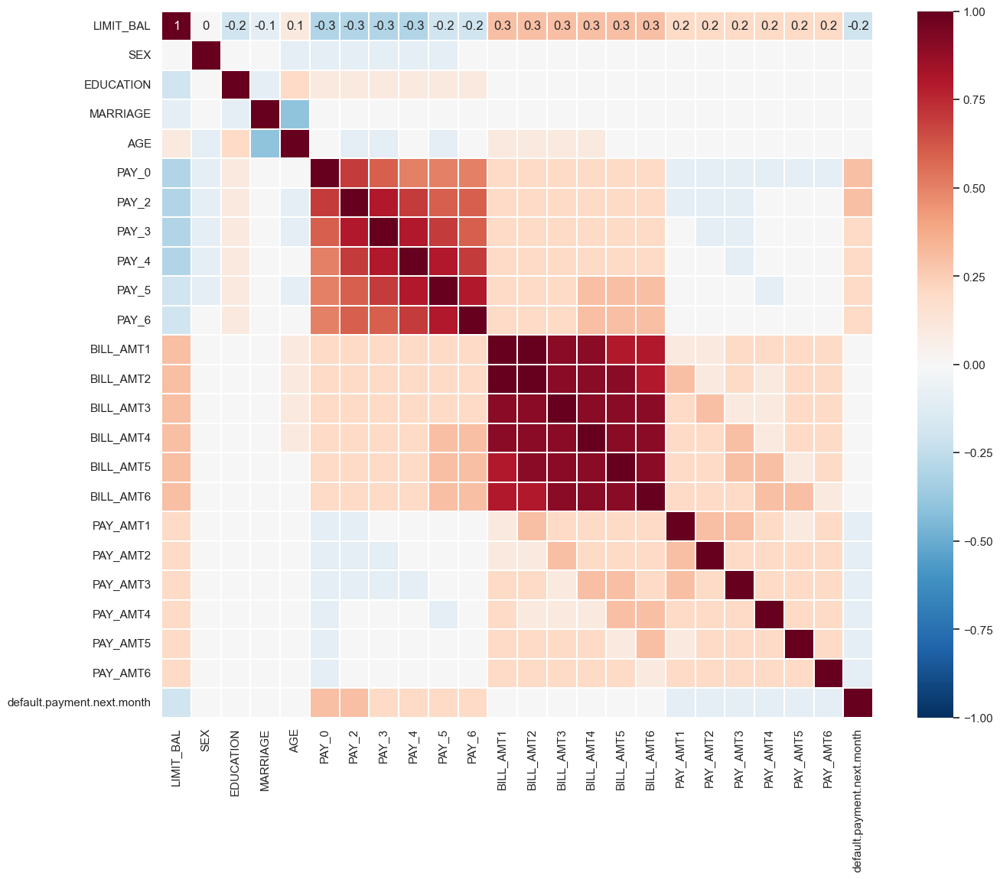

In [39]:
mapa_corr(credit)

Observaciones: Elevada correlación entre las características 'PAY' y entre las 'BILL', con lo cual se decide quedar con solo una de cada tipo.

In [40]:
#Correlacion entre las features y target
def indice_correlacion(df):
  """
  Grafica el campo dicretizado de
  índices de correlación entre las
  características del Data Set.

  :param:
  :df: DataFrame con los atributos.
  """
  plt.figure(figsize=(20, 2))
  correlacion = df.iloc[:, 1:].corr().round(1)
  ultima_fila = correlacion.iloc[-1:, :]
  print(ultima_fila)
  sns.heatmap(data=ultima_fila, vmin=-1, vmax=1, cmap='RdBu_r', linewidths=1, annot=False, cbar=True)
  plt.show()

                            LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  \
default.payment.next.month       -0.2 -0.0        0.0      -0.0  0.0    0.3   

                            PAY_2  PAY_3  PAY_4  PAY_5  ...  BILL_AMT4  \
default.payment.next.month    0.3    0.2    0.2    0.2  ...       -0.0   

                            BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  \
default.payment.next.month       -0.0       -0.0      -0.1      -0.1   

                            PAY_AMT3  PAY_AMT4  PAY_AMT5  PAY_AMT6  \
default.payment.next.month      -0.1      -0.1      -0.1      -0.1   

                            default.payment.next.month  
default.payment.next.month                         1.0  

[1 rows x 24 columns]


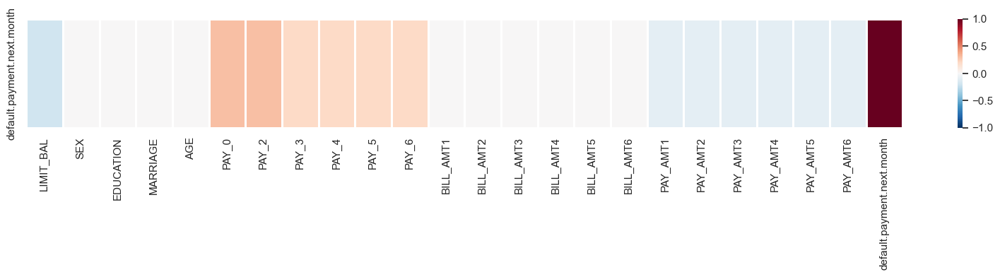

In [41]:
indice_correlacion(credit)

Observaciones: En términos lineales, son las características 'PAY' las que resultan más útiles para predecir la variable objetivo.

c:\Users\fabri\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\fabri\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\fabri\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\fabri\App

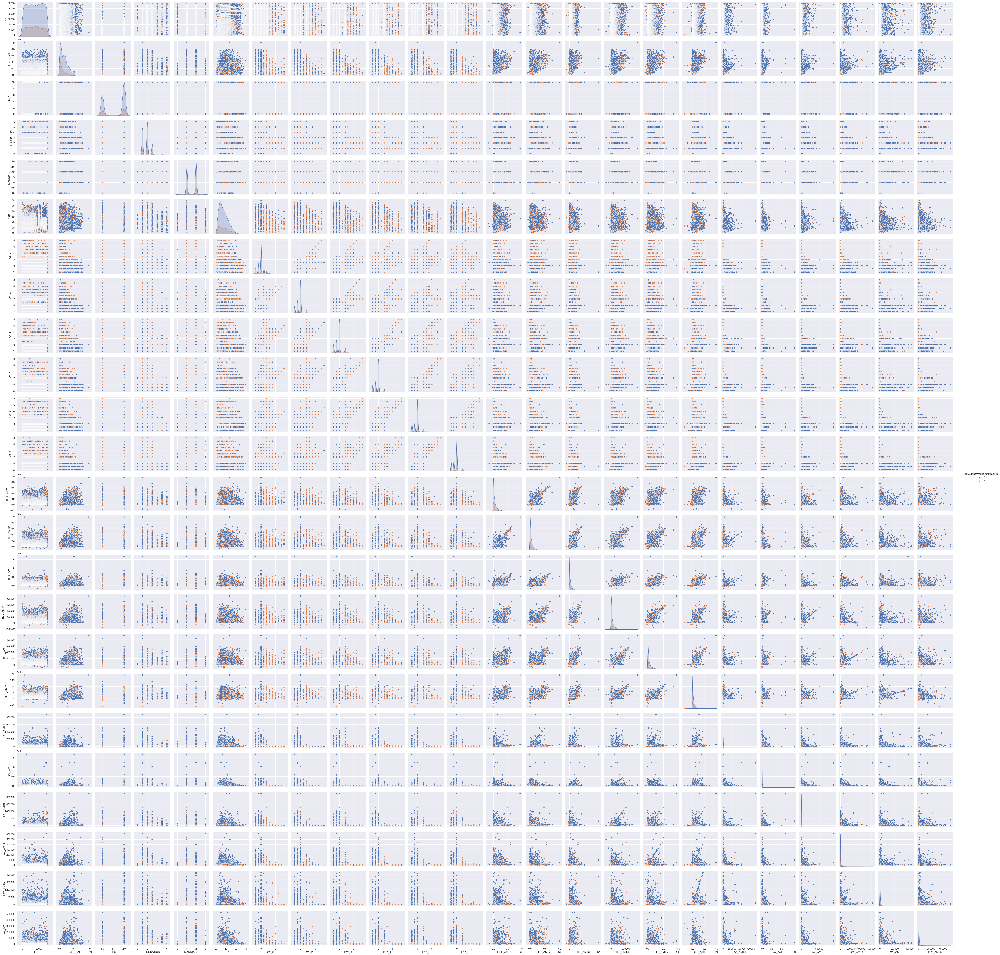

In [22]:
# Crear pairplot
sns.pairplot(credit, hue='default.payment.next.month')
plt.show()

Observaciones: No se aprecia un par de características que permitan discriminar las clases de la variable objetivo.

In [42]:
def reduccion(df, columnas):
  """
  Elimina las columnas, dentro del rango
  indicado, del dataframe de entrada.

  :param:
  :df: DataFrame con los atributos.
  :columnas: Columnas a eliminar.
  """
  df = df.drop(columnas, axis=1)
  return df

In [61]:
credit_filtered = reduccion(credit, ['LIMIT_BAL','SEX','EDUCATION','MARRIAGE','AGE','PAY_2','PAY_3','PAY_4','PAY_5','PAY_6','BILL_AMT1','BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6','PAY_AMT1','PAY_AMT2','PAY_AMT3','PAY_AMT4','PAY_AMT5','PAY_AMT6'])

In [50]:
def distribuciones_reales(df):
  """
  Genera la distribución de las características
  numéricas almacenadas en el DataFrame de entrada.

  :param:
  :df: DataFrame con los atributos.
  """
  # Obtén la lista de nombres de columnas numéricas
  features_numericas = df.select_dtypes(include=['float64', 'int64']).columns

  # Itera sobre las columnas numéricas y grafica la distribución de cada una
  for feature in features_numericas:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[feature], bins=20, edgecolor='black', kde=False)
    plt.title(f'Histograma de {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frecuencia absoluta')
    plt.grid(True)
    plt.show()

c:\Users\fabri\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


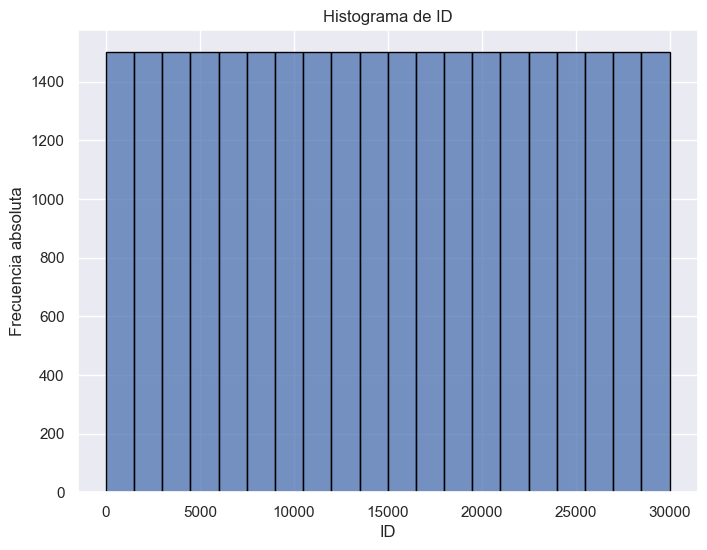

c:\Users\fabri\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


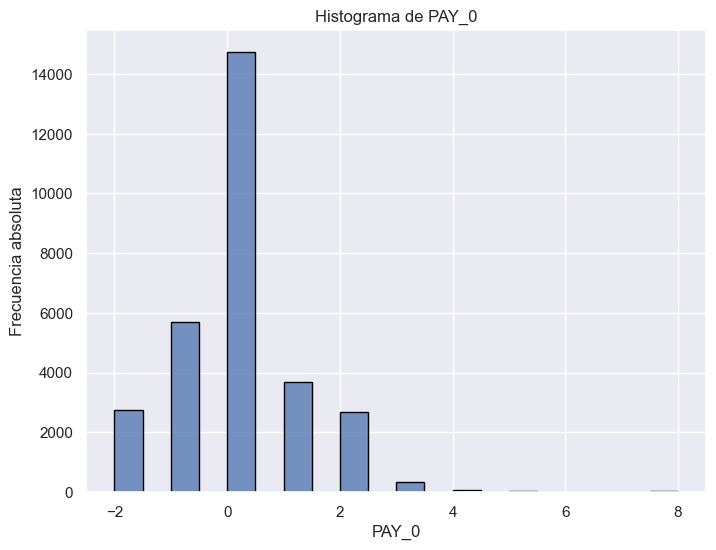

c:\Users\fabri\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


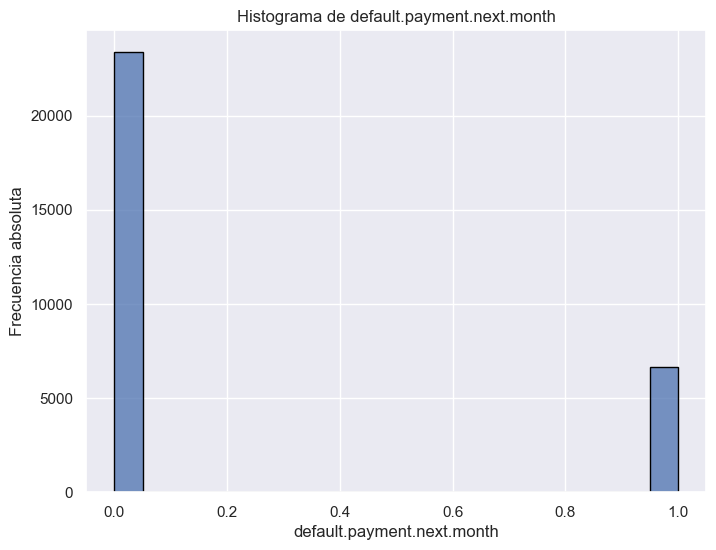

In [62]:
distribuciones_reales(credit_filtered)

In [52]:
def outliers(df, multiplo):
  """
  Nos permite definir umbrales de outliers,
  y detectar estos últimos.

  :param:
  :df: DataFrame con los atributos.
  :multiplo: Cantidad de desvíos estándar para definir
            umbral de 'outliers'.
  """
  # Se recorre cada característica
  features = df.columns
  for feature in features[1:]:
    mean = df[feature].mean()
    std = df[feature].std()
    lower_bound = mean - multiplo * std
    upper_bound = mean + multiplo * std
    outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)]
    # Crea una nueva figura para cada boxplot
    sns.boxplot(x=df[feature])
    plt.title(f'Boxplot de {feature}')
    plt.xlabel(feature)
    plt.axvline(x=lower_bound, color='r', linestyle='--')
    plt.axvline(x=upper_bound, color='r', linestyle='--')
    plt.show()

    print(f"Número de outliers en {feature}: {outliers[feature].count()}.\nLo que representa un {round(100*(outliers[feature].count()/df.shape[0]),1)} % del total de registros.\n")
    print(f'Outliers en {feature} (considerando 3 desvíos estándar):')
    print(outliers[feature])
    print('\n')


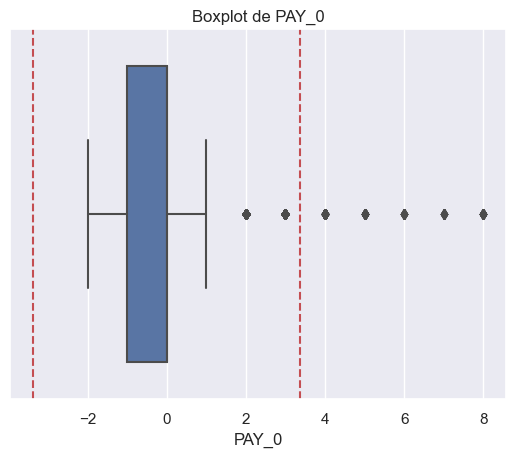

Número de outliers en PAY_0: 141.
Lo que representa un 0.5 % del total de registros.

Outliers en PAY_0 (considerando 3 desvíos estándar):
360      4
362      4
649      8
749      8
801      4
        ..
29651    5
29668    4
29744    4
29814    5
29997    4
Name: PAY_0, Length: 141, dtype: int64




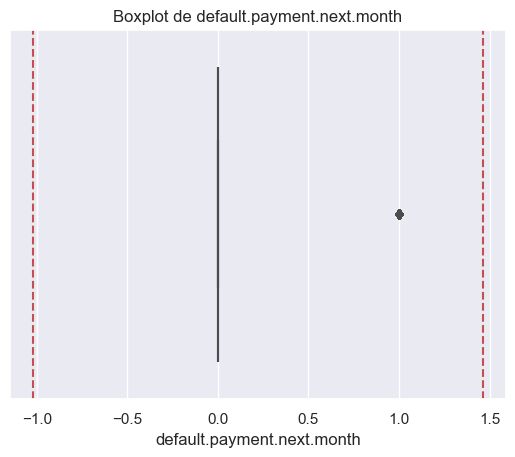

Número de outliers en default.payment.next.month: 0.
Lo que representa un 0.0 % del total de registros.

Outliers en default.payment.next.month (considerando 3 desvíos estándar):
Series([], Name: default.payment.next.month, dtype: int64)




In [63]:
outliers(credit_filtered, 3)

Observaciones: Considerando la caracteríastica 'PAY_0', los outliers representan el 0.5%, con lo cual se condideró el impacto en los resultados no resulta significativo. Debido a la pequeña cantidad de registros clasificados como *outliers*, se decide usar la técnica de poda para eliminar aquellos registros donde haya al menos una característica con *outliers*.

In [54]:
def poda(df, multiplo):
    """
    Elimina mediante poda los registros donde al menos
    una de las características presente un outliers
    con el umbral definido.

    :param:
    :df: DataFrame con los atributos.
    :multiplo: Cantidad de desvíos estándar para definir
                umbral de 'outliers'.    
    """
    # Seleccionamos solo las columnas numéricas
    numeric_columns = df.select_dtypes(include=[np.number]).columns

    # Calculamos el umbral de outliers para cada columna numérica
    thresholds = {}
    for column in numeric_columns:
        mean = df[column].mean()
        std_dev = df[column].std()
        thresholds[column] = (mean - 3 * std_dev, mean + 3 * std_dev)

    # Filtramos el DataFrame para eliminar registros con outliers
    filtered_df = df.copy()
    for column, (lower, upper) in thresholds.items():
        filtered_df = filtered_df[(filtered_df[column] > lower) & (filtered_df[column] < upper)]

    return filtered_df

In [64]:
credit_filtered_reducted = poda(credit_filtered, 3)

In [65]:
credit_filtered_reducted.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29859 entries, 0 to 29999
Data columns (total 3 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          29859 non-null  int64
 1   PAY_0                       29859 non-null  int64
 2   default.payment.next.month  29859 non-null  int64
dtypes: int64(3)
memory usage: 933.1 KB


Observaciones: El método de poda se aplicó para todos los registros donde al menos se encontrara una característica donde se ubicara un *outlier* según el umbral propuesto de 3 desvíos estándar. Con estos resultados, se observó que el dataframe disminuyó su cantidad de registros en un 0.5% (de 30000 a 29859), lo cual no parece significativo a priori.

En este caso se decidió estandarizar las características del dataframe dado que presentan rangos variables.

In [58]:
def escalado(df, ini_col, fin_col):
    """
    Escala las columnas, dentro del rango
    indicado, del dataframe de entrada.

    :param:
    :df: DataFrame con los atributos.
    :col_ini: Columna a partir de la cual eliminar.
    :col_fin: Columna hasta la cual eliminar.

    """
    # Normalizar columnas desde fin_col a fin_col
    cols_to_normalize = df.columns[ini_col:fin_col]

    df_normalized = df.copy()

    for col in cols_to_normalize:
        mean = df[col].mean()
        std = df[col].std()
        df_normalized[col] = (df[col] - mean) / std

    return df_normalized

In [66]:
credit_filtered_reducted_normalizaded = escalado(credit_filtered_reducted, 0, 7)

In [67]:
# Guardado del dataframe procesado
def guardar(df, path):
  """
  Guarda el data frame con los datos procesados
  en un archivo con terminación xlsx.

  :param:
  :df: DataFrame con los atributos.
  """
  try:
    df.to_csv(path, index=False)
  
  except:
    print('No se han podido persistir los datos.')

In [73]:
# Carga la ruta al archivo de datos
ruta = os.path.dirname((os.path.abspath('data_features')))
ruta_datos = os.path.join(ruta, "dataset/UCI_Credit_Card_procesados.csv")

guardar(credit_filtered_reducted_normalizaded, ruta_datos)